In [46]:
import pandas as pd
import numpy as np

In [47]:
round_df = pd.read_csv('data/rounds.csv')
round_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114949 entries, 0 to 114948
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   company_permalink        114949 non-null  object 
 1   company_name             114948 non-null  object 
 2   company_category_list    111539 non-null  object 
 3   company_country_code     106271 non-null  object 
 4   company_state_code       104003 non-null  object 
 5   company_region           104782 non-null  object 
 6   company_city             104785 non-null  object 
 7   funding_round_permalink  114949 non-null  object 
 8   funding_round_type       114949 non-null  object 
 9   funding_round_code       31140 non-null   object 
 10  funded_at                114949 non-null  object 
 11  raised_amount_usd        94959 non-null   float64
dtypes: float64(1), object(11)
memory usage: 10.5+ MB


In [48]:
companies_df = pd.read_csv('data/companies.csv')
companies_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66368 entries, 0 to 66367
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   permalink          66368 non-null  object
 1   name               66367 non-null  object
 2   homepage_url       61310 non-null  object
 3   category_list      63220 non-null  object
 4   funding_total_usd  66368 non-null  object
 5   status             66368 non-null  object
 6   country_code       59410 non-null  object
 7   state_code         57821 non-null  object
 8   region             58338 non-null  object
 9   city               58340 non-null  object
 10  funding_rounds     66368 non-null  int64 
 11  founded_at         51147 non-null  object
 12  first_funding_at   66344 non-null  object
 13  last_funding_at    66368 non-null  object
dtypes: int64(1), object(13)
memory usage: 7.1+ MB


In [49]:
##Rename the column
companies_df.rename(columns={'permalink':'company_permalink','name':'company_name'},inplace=True)

In [50]:
output = round_df.merge(companies_df, on="company_name", how="left").fillna(0)

In [51]:
output.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115943 entries, 0 to 115942
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   company_permalink_x      115943 non-null  object 
 1   company_name             115943 non-null  object 
 2   company_category_list    115943 non-null  object 
 3   company_country_code     115943 non-null  object 
 4   company_state_code       115943 non-null  object 
 5   company_region           115943 non-null  object 
 6   company_city             115943 non-null  object 
 7   funding_round_permalink  115943 non-null  object 
 8   funding_round_type       115943 non-null  object 
 9   funding_round_code       115943 non-null  object 
 10  funded_at                115943 non-null  object 
 11  raised_amount_usd        115943 non-null  float64
 12  company_permalink_y      115943 non-null  object 
 13  homepage_url             115943 non-null  object 
 14  cate

In [52]:
output.isna().sum()

company_permalink_x        0
company_name               0
company_category_list      0
company_country_code       0
company_state_code         0
company_region             0
company_city               0
funding_round_permalink    0
funding_round_type         0
funding_round_code         0
funded_at                  0
raised_amount_usd          0
company_permalink_y        0
homepage_url               0
category_list              0
funding_total_usd          0
status                     0
country_code               0
state_code                 0
region                     0
city                       0
funding_rounds             0
founded_at                 0
first_funding_at           0
last_funding_at            0
dtype: int64

In [53]:
output['company_permalink_x'] == output['company_permalink_y']

0         True
1         True
2         True
3         True
4         True
          ... 
115938    True
115939    True
115940    True
115941    True
115942    True
Length: 115943, dtype: bool

In [54]:
output.head()

,company_permalink_x,company_name,company_category_list,company_country_code,company_state_code,company_region,company_city,funding_round_permalink,funding_round_type,funding_round_code,...,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at
0,/organization/-fame,#fame,Media,IND,16,Mumbai,Mumbai,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,...,10000000,operating,IND,16,Mumbai,Mumbai,1,0,2015-01-05,2015-01-05
1,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,USA,DE,DE - Other,Delaware City,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,A,...,700000,operating,USA,DE,DE - Other,Delaware City,2,2014-09-04,2014-03-01,2014-10-14
2,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,USA,DE,DE - Other,Delaware City,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,0,...,700000,operating,USA,DE,DE - Other,Delaware City,2,2014-09-04,2014-03-01,2014-10-14
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",Apps|Games|Mobile,0,0,0,0,/funding-round/650b8f704416801069bb178a1418776b,venture,B,...,3406878,operating,0,0,0,0,1,0,2014-01-30,2014-01-30
4,/organization/0-6-com,0-6.com,Curated Web,CHN,22,Beijing,Beijing,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,...,2000000,operating,CHN,22,Beijing,Beijing,1,2007-01-01,2008-03-19,2008-03-19


In [55]:
output = output.drop_duplicates()
output.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115943 entries, 0 to 115942
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   company_permalink_x      115943 non-null  object 
 1   company_name             115943 non-null  object 
 2   company_category_list    115943 non-null  object 
 3   company_country_code     115943 non-null  object 
 4   company_state_code       115943 non-null  object 
 5   company_region           115943 non-null  object 
 6   company_city             115943 non-null  object 
 7   funding_round_permalink  115943 non-null  object 
 8   funding_round_type       115943 non-null  object 
 9   funding_round_code       115943 non-null  object 
 10  funded_at                115943 non-null  object 
 11  raised_amount_usd        115943 non-null  float64
 12  company_permalink_y      115943 non-null  object 
 13  homepage_url             115943 non-null  object 
 14  cate

In [56]:
output.head()

,company_permalink_x,company_name,company_category_list,company_country_code,company_state_code,company_region,company_city,funding_round_permalink,funding_round_type,funding_round_code,...,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at
0,/organization/-fame,#fame,Media,IND,16,Mumbai,Mumbai,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,...,10000000,operating,IND,16,Mumbai,Mumbai,1,0,2015-01-05,2015-01-05
1,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,USA,DE,DE - Other,Delaware City,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,A,...,700000,operating,USA,DE,DE - Other,Delaware City,2,2014-09-04,2014-03-01,2014-10-14
2,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,USA,DE,DE - Other,Delaware City,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,0,...,700000,operating,USA,DE,DE - Other,Delaware City,2,2014-09-04,2014-03-01,2014-10-14
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",Apps|Games|Mobile,0,0,0,0,/funding-round/650b8f704416801069bb178a1418776b,venture,B,...,3406878,operating,0,0,0,0,1,0,2014-01-30,2014-01-30
4,/organization/0-6-com,0-6.com,Curated Web,CHN,22,Beijing,Beijing,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,...,2000000,operating,CHN,22,Beijing,Beijing,1,2007-01-01,2008-03-19,2008-03-19


In [57]:
##irrelevant columns : company_permalink_y,company_permalink_x,company_country_code,company_state_code,company_region,company_city,funding_round_permalink,
output['company_name'].value_counts()


Roost                                         48
Spire                                         44
Karma                                         44
Peach                                         28
Stoke                                         24
                                              ..
iLenze                                         1
iLEVEL Solutions                               1
Ilex Consumer Products Group                   1
ILiAD Biotechnologies                          1
İnovatiff Reklam ve Tanıtım Hizmetleri Tic     1
Name: company_name, Length: 66103, dtype: int64

In [58]:
round_df.head()


,company_permalink,company_name,company_category_list,company_country_code,company_state_code,company_region,company_city,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd
0,/organization/-fame,#fame,Media,IND,16,Mumbai,Mumbai,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,2015-01-05,10000000.0
1,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,USA,DE,DE - Other,Delaware City,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,A,2014-10-14,NaN
2,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,USA,DE,DE - Other,Delaware City,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,NaN,2014-03-01,700000.0
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",Apps|Games|Mobile,NaN,NaN,NaN,NaN,/funding-round/650b8f704416801069bb178a1418776b,venture,B,2014-01-30,3406878.0
4,/organization/0-6-com,0-6.com,Curated Web,CHN,22,Beijing,Beijing,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,2008-03-19,2000000.0


In [59]:
print(round_df.size)
round_df = round_df[round_df.raised_amount_usd.notnull()]

1379388


In [60]:
round_df.size

1139508

In [61]:
round_df['funding_round_code'].value_counts()

A    12807
B     8098
C     4220
D     1917
E      781
F      263
G       71
H       12
Name: funding_round_code, dtype: int64

In [62]:
round_df['raised_amount_usd'].isna().sum()

0

In [63]:
round_df['funding_round_code'].replace(np.nan, 0, inplace=True)
round_df['funding_round_code'].replace('A',1,inplace=True)
round_df['funding_round_code'].replace('B',2,inplace=True)
round_df['funding_round_code'].replace('C',3,inplace=True)
round_df['funding_round_code'].replace('D',4,inplace=True)
round_df['funding_round_code'].replace('E',5,inplace=True)
round_df['funding_round_code'].replace('F',6,inplace=True)
round_df['funding_round_code'].replace('G',7,inplace=True)
round_df['funding_round_code'].replace('H',8,inplace=True)
round_df['funding_round_code'].isna().sum()

0

In [64]:
round_df['funding_round_type'].value_counts()

venture                  50228
seed                     23603
debt_financing            6682
angel                     4860
grant                     2124
private_equity            1936
undisclosed               1582
convertible_note          1447
equity_crowdfunding       1228
post_ipo_equity            628
product_crowdfunding       386
post_ipo_debt              152
non_equity_assistance       73
secondary_market            30
Name: funding_round_type, dtype: int64

In [65]:
companies_df['status'].value_counts()

operating    53034
closed        6238
acquired      5549
ipo           1547
Name: status, dtype: int64

In [66]:
round_df.company_name.unique().size
print(companies_df.shape[0])
companies_df['is_roundA'] = np.zeros(companies_df.shape[0])   
companies_df['is_roundB'] = np.zeros(companies_df.shape[0])
companies_df['is_roundC'] = np.zeros(companies_df.shape[0])
companies_df['is_roundD'] = np.zeros(companies_df.shape[0])
companies_df['is_roundE'] = np.zeros(companies_df.shape[0])
companies_df['is_roundF'] = np.zeros(companies_df.shape[0])
companies_df['is_roundG'] = np.zeros(companies_df.shape[0])
companies_df['is_roundH'] = np.zeros(companies_df.shape[0])

66368


In [67]:
count = 0
dict = {}
   

for i in range(round_df.shape[0]):
    if round_df.iloc[i]['company_name'] not in dict:
        dict[round_df.iloc[i]['company_name']] = {}
        
        dict[round_df.iloc[i]['company_name']][1] = 0
        dict[round_df.iloc[i]['company_name']][2] = 0
        dict[round_df.iloc[i]['company_name']][3] = 0
        dict[round_df.iloc[i]['company_name']][4] = 0
        dict[round_df.iloc[i]['company_name']][5] = 0
        dict[round_df.iloc[i]['company_name']][6] = 0
        dict[round_df.iloc[i]['company_name']][7] = 0
        dict[round_df.iloc[i]['company_name']][8] = 0
        arr = round_df.iloc[i]['funding_round_code']
        dict[round_df.iloc[i]['company_name']][arr] = 1
    
    else: 
        arr = round_df.iloc[i]['funding_round_code']
        dict[round_df.iloc[i]['company_name']][arr] = 1
        
    # print(i)
    


In [68]:
countC = 0

# print(dict)


for i in range(companies_df.shape[0]):
    
    
    if companies_df.iloc[i]['company_name'] in dict.keys() :    
        companies_df.loc[countC,'is_roundA'] = dict[companies_df.iloc[i]['company_name']][1]
        companies_df.loc[countC,'is_roundB'] = dict[companies_df.iloc[i]['company_name']][2]
        companies_df.loc[countC,'is_roundC'] = dict[companies_df.iloc[i]['company_name']][3]
        companies_df.loc[countC,'is_roundD'] = dict[companies_df.iloc[i]['company_name']][4]
        companies_df.loc[countC,'is_roundE'] = dict[companies_df.iloc[i]['company_name']][5]
        companies_df.loc[countC,'is_roundF'] = dict[companies_df.iloc[i]['company_name']][6]
        companies_df.loc[countC,'is_roundG'] = dict[companies_df.iloc[i]['company_name']][7]
        companies_df.loc[countC,'is_roundH'] = dict[companies_df.iloc[i]['company_name']][8]
        
        
    countC += 1
    # print(countC)

In [69]:
# print(companies_df['is_roundA'].value_counts())
# print(companies_df['is_roundB'].value_counts())
# print(companies_df['is_roundC'].value_counts())
# print(companies_df['is_roundD'].value_counts())
# print(companies_df['is_roundE'].value_counts())
# print(companies_df['is_roundF'].value_counts())
# print(companies_df['is_roundG'].value_counts())
# print(companies_df['is_roundH'].value_counts())

In [70]:
companies_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66368 entries, 0 to 66367
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   company_permalink  66368 non-null  object 
 1   company_name       66367 non-null  object 
 2   homepage_url       61310 non-null  object 
 3   category_list      63220 non-null  object 
 4   funding_total_usd  66368 non-null  object 
 5   status             66368 non-null  object 
 6   country_code       59410 non-null  object 
 7   state_code         57821 non-null  object 
 8   region             58338 non-null  object 
 9   city               58340 non-null  object 
 10  funding_rounds     66368 non-null  int64  
 11  founded_at         51147 non-null  object 
 12  first_funding_at   66344 non-null  object 
 13  last_funding_at    66368 non-null  object 
 14  is_roundA          66368 non-null  float64
 15  is_roundB          66368 non-null  float64
 16  is_roundC          663

In [71]:
companies_df['category_list'].value_counts()

Software                                                                       3995
Biotechnology                                                                  3615
E-Commerce                                                                     1332
Mobile                                                                         1177
Clean Technology                                                               1133
                                                                               ... 
Consumer Internet|Marketplaces|Mobile|Mobile Payments|Transportation|Travel       1
Apps|Mobile|Private Social Networking                                             1
Cloud Computing|Enterprise Software|Infrastructure|PaaS|Social Media              1
Content|SaaS|Social Media Marketing|Software                                      1
Consumer Goods|E-Commerce|Internet                                                1
Name: category_list, Length: 27296, dtype: int64

In [72]:
investor = pd.read_csv('data/investments.csv')
invest_df = investor[['company_permalink','investor_permalink']].groupby(['company_permalink']).agg(['count'])

In [73]:
invest_df.head()

,investor_permalink
,count
company_permalink,
/organization/0-6-com,1
/organization/004-technologies,1
/organization/01games-technology,1
/organization/0xdata,14
/organization/1,13


In [74]:
companies_df = pd.merge(how='inner',left=companies_df, right=invest_df, left_on='company_permalink', right_on='company_permalink')

C:\Users\ATHARVA\AppData\Local\Temp\ipykernel_29116\2608423124.py:1: FutureWarning: merging between different levels is deprecated and will be removed in a future version. (1 levels on the left, 2 on the right)
  companies_df = pd.merge(how='inner',left=companies_df, right=invest_df, left_on='company_permalink', right_on='company_permalink')


In [75]:
companies_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44738 entries, 0 to 44737
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   company_permalink            44738 non-null  object 
 1   company_name                 44737 non-null  object 
 2   homepage_url                 41971 non-null  object 
 3   category_list                42309 non-null  object 
 4   funding_total_usd            44738 non-null  object 
 5   status                       44738 non-null  object 
 6   country_code                 39748 non-null  object 
 7   state_code                   38563 non-null  object 
 8   region                       38926 non-null  object 
 9   city                         38928 non-null  object 
 10  funding_rounds               44738 non-null  int64  
 11  founded_at                   33318 non-null  object 
 12  first_funding_at             44718 non-null  object 
 13  last_funding_at 

In [76]:
companies_df = companies_df.rename(columns={"('investor_permalink', 'count')_x": "investor_count"})

In [77]:
companies_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44738 entries, 0 to 44737
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   company_permalink            44738 non-null  object 
 1   company_name                 44737 non-null  object 
 2   homepage_url                 41971 non-null  object 
 3   category_list                42309 non-null  object 
 4   funding_total_usd            44738 non-null  object 
 5   status                       44738 non-null  object 
 6   country_code                 39748 non-null  object 
 7   state_code                   38563 non-null  object 
 8   region                       38926 non-null  object 
 9   city                         38928 non-null  object 
 10  funding_rounds               44738 non-null  int64  
 11  founded_at                   33318 non-null  object 
 12  first_funding_at             44718 non-null  object 
 13  last_funding_at 

In [78]:
companies_df.drop(columns=[companies_df.columns[-1]],inplace=True)

In [79]:
companies_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44738 entries, 0 to 44737
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   company_permalink  44738 non-null  object 
 1   company_name       44737 non-null  object 
 2   homepage_url       41971 non-null  object 
 3   category_list      42309 non-null  object 
 4   funding_total_usd  44738 non-null  object 
 5   status             44738 non-null  object 
 6   country_code       39748 non-null  object 
 7   state_code         38563 non-null  object 
 8   region             38926 non-null  object 
 9   city               38928 non-null  object 
 10  funding_rounds     44738 non-null  int64  
 11  founded_at         33318 non-null  object 
 12  first_funding_at   44718 non-null  object 
 13  last_funding_at    44738 non-null  object 
 14  is_roundA          44738 non-null  float64
 15  is_roundB          44738 non-null  float64
 16  is_roundC          447

In [80]:
companies_df.isnull().sum()

company_permalink        0
company_name             1
homepage_url          2767
category_list         2429
funding_total_usd        0
status                   0
country_code          4990
state_code            6175
region                5812
city                  5810
funding_rounds           0
founded_at           11420
first_funding_at        20
last_funding_at          0
is_roundA                0
is_roundB                0
is_roundC                0
is_roundD                0
is_roundE                0
is_roundF                0
is_roundG                0
is_roundH                0
dtype: int64

In [81]:
companies_df.to_csv('final.csv',index=False)

In [82]:
df = pd.read_csv('/content/final.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/final.csv'

In [ ]:
df.drop(['founded_at','company_permalink','homepage_url','region','city','state_code'],inplace=True,axis=1)

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.shape[0]

38571

In [ ]:
#for generating report
pip uninstall pandas_profiling

Found existing installation: pandas-profiling 3.4.0
Uninstalling pandas-profiling-3.4.0:
  Would remove:
    /usr/local/bin/pandas_profiling
    /usr/local/lib/python3.7/dist-packages/pandas_profiling-3.4.0.dist-info/*
    /usr/local/lib/python3.7/dist-packages/pandas_profiling/*
Proceed (y/n)? y
  Successfully uninstalled pandas-profiling-3.4.0


In [ ]:
pip install pandas-profiling[notebook,html]

  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=54440af5b3c5af96685c54bcee0be8fd41e3b93d7f8b131b238299c8aef984f8
  Stored in directory: c:\users\atharva\appdata\local\pip\cache\wheels\1d\05\04\c6d7d3b66539d9e659ac6dfe81e2d0fd4c1a8316cc5a403300
Successfully built htmlmin
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

In [ ]:
profile = ProfileReport(df, title="Startup Dataset", html={'style': {'full_width': True}}, sort=None)

NameError: name 'df' is not defined

In [ ]:
profile.to_widgets()

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:426: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file="ReportEDA_29_3.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38571 entries, 0 to 44736
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   company_name       38571 non-null  object 
 1   category_list      38571 non-null  object 
 2   funding_total_usd  38571 non-null  object 
 3   status             38571 non-null  object 
 4   country_code       38571 non-null  object 
 5   funding_rounds     38571 non-null  int64  
 6   first_funding_at   38571 non-null  object 
 7   last_funding_at    38571 non-null  object 
 8   is_roundA          38571 non-null  float64
 9   is_roundB          38571 non-null  float64
 10  is_roundC          38571 non-null  float64
 11  is_roundD          38571 non-null  float64
 12  is_roundE          38571 non-null  float64
 13  is_roundF          38571 non-null  float64
 14  is_roundG          38571 non-null  float64
 15  is_roundH          38571 non-null  float64
 16  investor_count     385

Category based

Funding based

Status based ( acquired/operational etc.)

Country code based ( pie chart or something)

In [ ]:
df.head()

,company_name,category_list,funding_total_usd,status,country_code,funding_rounds,first_funding_at,last_funding_at,is_roundA,is_roundB,is_roundC,is_roundD,is_roundE,is_roundF,is_roundG,is_roundH,investor_count
0,0-6.com,Curated Web,2000000,operating,CHN,1,2008-03-19,2008-03-19,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,004 Technologies,Software,-,operating,USA,1,2014-07-24,2014-07-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,01Games Technology,Games,41250,operating,HKG,1,2014-07-01,2014-07-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,H2O.ai,Analytics,33600000,operating,USA,4,2013-01-03,2015-11-09,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,14
4,One Inc.,Mobile,1150050,operating,USA,3,2011-07-20,2014-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13


In [ ]:
df['category_list'].value_counts()

Software                                                      2503
Biotechnology                                                 1997
E-Commerce                                                     864
Mobile                                                         758
Clean Technology                                               710
                                                              ... 
Biotechnology|Clinical Trials|Startups                           1
Sensors|Systems|Wireless                                         1
Consumers|Publishing                                             1
Energy|Energy Management|Renewable Energies                      1
Consumer Electronics|Internet of Things|Telecommunications       1
Name: category_list, Length: 17708, dtype: int64

In [ ]:
df['label'] = 0
df.loc[df.status == 'ipo', 'label'] = 1
df.loc[df.status == 'acquired', 'label'] = 1
df.loc[df.status == 'operating', 'label'] = 1
df.head()

,company_name,category_list,funding_total_usd,status,country_code,funding_rounds,first_funding_at,last_funding_at,is_roundA,is_roundB,is_roundC,is_roundD,is_roundE,is_roundF,is_roundG,is_roundH,investor_count,label
0,0-6.com,Curated Web,2000000,operating,CHN,1,2008-03-19,2008-03-19,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
1,004 Technologies,Software,-,operating,USA,1,2014-07-24,2014-07-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
2,01Games Technology,Games,41250,operating,HKG,1,2014-07-01,2014-07-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
3,H2O.ai,Analytics,33600000,operating,USA,4,2013-01-03,2015-11-09,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,14,1
4,One Inc.,Mobile,1150050,operating,USA,3,2011-07-20,2014-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13,1


In [ ]:
data_stats = df.groupby('status').count()
data_stats

,company_name,category_list,funding_total_usd,country_code,funding_rounds,first_funding_at,last_funding_at,is_roundA,is_roundB,is_roundC,is_roundD,is_roundE,is_roundF,is_roundG,is_roundH,investor_count,label
status,,,,,,,,,,,,,,,,,
acquired,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616,4616
closed,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857,2857
ipo,915,915,915,915,915,915,915,915,915,915,915,915,915,915,915,915,915
operating,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183,30183


In [ ]:
df.head(20)

,company_name,category_list,funding_total_usd,status,country_code,funding_rounds,first_funding_at,last_funding_at,is_roundA,is_roundB,is_roundC,is_roundD,is_roundE,is_roundF,is_roundG,is_roundH,investor_count,label
0,0-6.com,Curated Web,2000000,operating,CHN,1,2008-03-19,2008-03-19,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
1,004 Technologies,Software,-,operating,USA,1,2014-07-24,2014-07-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
2,01Games Technology,Games,41250,operating,HKG,1,2014-07-01,2014-07-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
3,H2O.ai,Analytics,33600000,operating,USA,4,2013-01-03,2015-11-09,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,14,1
4,One Inc.,Mobile,1150050,operating,USA,3,2011-07-20,2014-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13,1
5,"1,2,3 Listo",E-Commerce,40000,operating,CHL,1,2013-02-18,2013-02-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
6,1-800-DENTIST,Health and Wellness,-,operating,USA,1,2010-08-19,2010-08-19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,1
7,1 Mainstream,Apps|Cable|Distribution|Software,5000000,acquired,USA,1,2015-03-17,2015-03-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
8,1000 Corks,Search,40000,operating,USA,1,2011-08-23,2011-08-23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
9,1000 Markets,Art|E-Commerce|Marketplaces,500000,acquired,USA,1,2009-05-15,2009-05-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1


In [ ]:
import matplotlib as plt

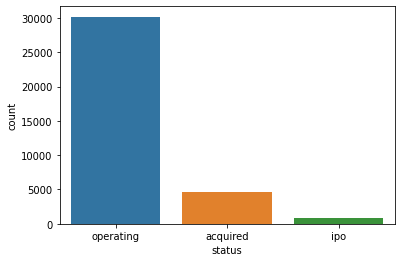

In [ ]:
import seaborn as sns
import matplotlib as plt

sns.countplot(x='status', data=df.loc[(df['label']== 1)])

 
# Rotate x-labels


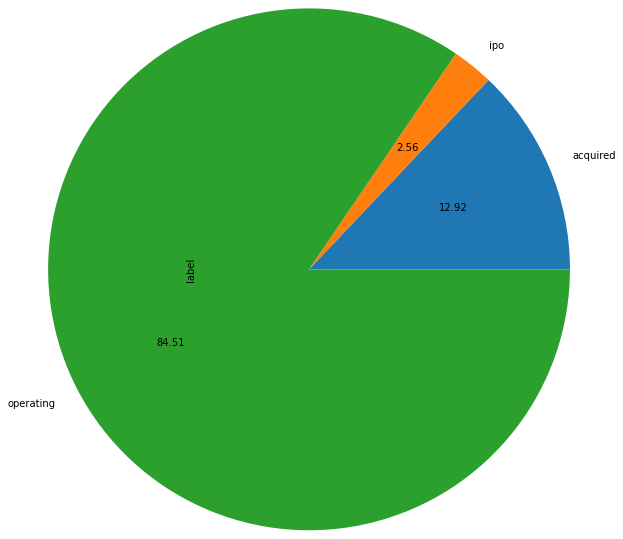

In [ ]:
from matplotlib import pyplot as plt
data_stats =df.loc[df['label'] == 1] 
data_stats = data_stats.groupby('status').count()

data_stats =data_stats.loc[data_stats['label']>1] 
data_stats.plot.pie(y='label', radius=3, legend=False, autopct=lambda p: format(p, '.2f') )
plt.show()

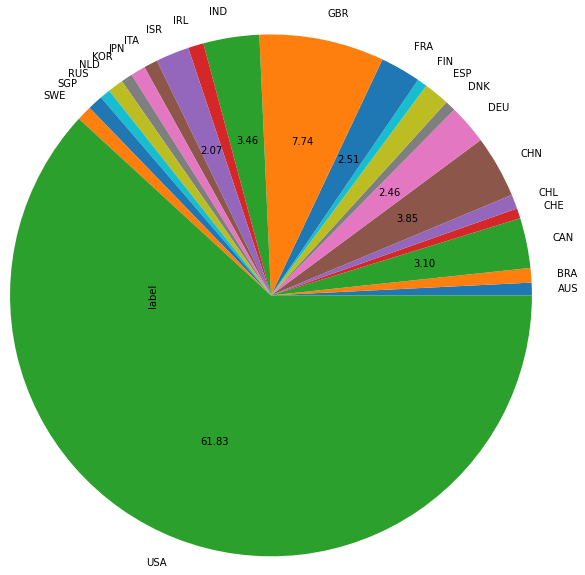

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt

dfPie =df.loc[df['label'] == 1] 
#dfPie= dfPie.loc[dfPie.groupby(['country_code']).count()>10]
dfPie = dfPie.groupby('country_code').count()
pie_stats =dfPie.loc[dfPie['label'] > 150] 
#dfPie.groupby(['country_code']).sum().plot(kind='pie', y='label')
pie_stats.plot.pie(y='label', radius=3, legend=False, autopct=lambda p: format(p, '.2f') if p >= 2 else None)
#dfPie.groupby(['country_code']).sum().plot.pie(y='label', legend=False, autopct=lambda p: format(p, '.2f') if p > 1 else None)

plt.show()


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['status'] = le.fit_transform(df['status'])

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['category_list'] = le.fit_transform(df['category_list'])

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['label'] = le.fit_transform(df['label'])

In [ ]:
df.loc[df["funding_total_usd"] == "-", "funding_total_usd"] = '0'

In [ ]:
df['funding_total_usd'] = df['funding_total_usd'].astype(float)

In [ ]:

df.corr()

,category_list,funding_total_usd,status,funding_rounds,is_roundA,is_roundB,is_roundC,is_roundD,is_roundE,is_roundF,is_roundG,is_roundH,investor_count,label
category_list,1.000000,-0.008772,-0.034000,-0.097778,-0.056252,-0.019327,-0.007400,-0.003979,-0.007348,-0.010239,-0.011377,0.002334,-0.075007,-0.031042
funding_total_usd,-0.008772,1.000000,-0.020362,0.126778,0.032477,0.072771,0.096078,0.100842,0.096203,0.080924,0.054950,0.045515,0.116921,0.011591
status,-0.034000,-0.020362,1.000000,-0.035650,-0.063433,-0.121510,-0.122106,-0.085300,-0.050084,-0.015136,-0.000714,0.001221,-0.087297,0.393465
funding_rounds,-0.097778,0.126778,-0.035650,1.000000,0.308252,0.423468,0.427882,0.379883,0.306736,0.208014,0.129004,0.046880,0.616841,0.069901
is_roundA,-0.056252,0.032477,-0.063433,0.308252,1.000000,0.329758,0.153716,0.077968,0.046712,0.022424,0.013423,0.000244,0.307118,0.013422
is_roundB,-0.019327,0.072771,-0.121510,0.423468,0.329758,1.000000,0.401547,0.223120,0.132179,0.072393,0.040404,0.012321,0.403081,0.016654
is_roundC,-0.007400,0.096078,-0.122106,0.427882,0.153716,0.401547,1.000000,0.433036,0.255231,0.137749,0.065879,0.026005,0.430829,0.021136
is_roundD,-0.003979,0.100842,-0.085300,0.379883,0.077968,0.223120,0.433036,1.000000,0.432124,0.229495,0.124169,0.041687,0.390218,0.024632
is_roundE,-0.007348,0.096203,-0.050084,0.306736,0.046712,0.132179,0.255231,0.432124,1.000000,0.407693,0.198311,0.067276,0.307283,0.019459
is_roundF,-0.010239,0.080924,-0.015136,0.208014,0.022424,0.072393,0.137749,0.229495,0.407693,1.000000,0.400977,0.136212,0.217962,0.012104


In [ ]:
df

,company_name,category_list,funding_total_usd,status,country_code,funding_rounds,first_funding_at,last_funding_at,is_roundA,is_roundB,is_roundC,is_roundD,is_roundE,is_roundF,is_roundG,is_roundH,investor_count,label
0,0-6.com,9499,2000000.0,3,CHN,1,2008-03-19,2008-03-19,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
1,004 Technologies,17467,0.0,3,USA,1,2014-07-24,2014-07-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
2,01Games Technology,14075,41250.0,3,HKG,1,2014-07-01,2014-07-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
3,H2O.ai,1786,33600000.0,3,USA,4,2013-01-03,2015-11-09,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,14,1
4,One Inc.,16299,1150050.0,3,USA,3,2011-07-20,2014-02-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44731,Zytoprotec,5472,2686600.0,3,AUT,1,2013-01-29,2013-01-29,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
44732,Zzish,1793,1120000.0,3,GBR,3,2014-03-24,2015-02-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1
44733,ZZNode Science and Technology,12669,1587301.0,3,CHN,1,2012-04-01,2012-04-01,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1
44734,Zzzzapp Wireless ltd.,1388,114304.0,3,HRV,4,2011-11-01,2014-03-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1
